<a href="https://colab.research.google.com/github/AlexanderWangY/GuessTheGenre/blob/main/MovieGenreGuesser.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This is my Movie Poster Genre guessing computer vision model. It uses resnet152 as its pretrained model and it is trained across 5 classes of movies viz: Horror, Romance, Action, Animation, and Fantasy.

Try and play around a little and send any questions or concerns to alexander.yisu.wang@outlook.com.

Test version hosted @ [HuggingFace](https://huggingface.co/spaces/AlexanderWangY/MoviePosterGenreGuesser)


In [ ]:
!pip install fastai duckduckgo_search==2.9.1 fastbook

In [ ]:
# Importing dependencies and making searching function
from fastbook import *
from fastai.vision.widgets import *

def search_images(term, max_images=30):
    print(f"Searching for '{term}'")
    return L(search_images_ddg(term, max_images=max_images))

In [ ]:
urls = search_images('horror movie poster', max_images=10)
urls[0]

Searching for 'horror movie poster'


'https://assets.website-files.com/5bf1c2ccde18dd05bd430ccc/5bf1c32c017c21412909f273_598191033fd40e0001129b77_horror-blog-conjuring.jpeg'

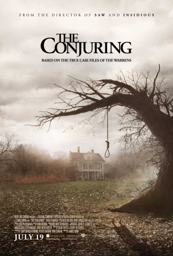

In [ ]:
from fastdownload import download_url
dest = 'horror.jpg'
download_url(urls[0], dest, show_progress=False)

from fastai.vision.all import *
im = Image.open(dest)
im.to_thumb(256,256)

In [ ]:
# Testing different posters
download_url(search_images('horror movie poster', max_images=1)[0], 'horror.jpg', show_progress=False)
download_url(search_images('action movie poster', max_images=1)[0], 'action.jpg', show_progress=False)
download_url(search_images('animation movie poster', max_images=1)[0], 'animation.jpg', show_progress=False)
download_url(search_images('fantasy movie poster', max_images=1)[0], 'fantasy.jpg', show_progress=False)
download_url(search_images('romance movie poster', max_images=1)[0], 'romance.jpg', show_progress=False)

Searching for 'horror movie poster'
Searching for 'action movie poster'
Searching for 'animation movie poster'
Searching for 'fantasy movie poster'
Searching for 'romance movie poster'


Path('romance.jpg')

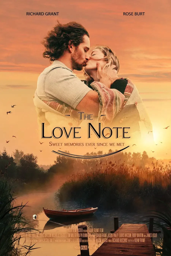

In [ ]:
im2 = Image.open('romance.jpg')
im2.to_thumb(256, 256)

In [ ]:
# Downloading all the different genres, 300 images each
searches = ['horror', 'action', 'animation', 'fantasy', 'romance']
path = Path('posters')
from time import sleep


for o in searches:
    dest = (path/o)
    dest.mkdir(exist_ok=True, parents=True)
    download_images(dest, urls=search_images(f'{o} movie poster', 300))
    resize_images(path/o, max_size=400, dest=path/o)

Searching for 'horror movie poster'


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Searching for 'action movie poster'
Searching for 'animation movie poster'
Searching for 'fantasy movie poster'
Searching for 'romance movie poster'


In [ ]:
# Removing images that failed to download correctly
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
len(failed)

97

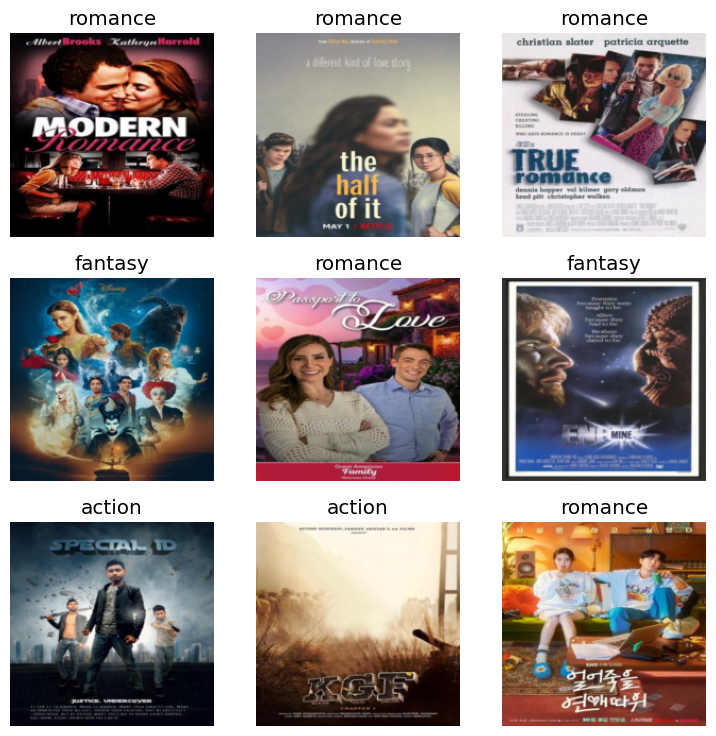

In [ ]:
# Setting the datablock and preprocessing images before training
posters = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=[Resize(192, method='squish')]
).dataloaders(path, bs=32)

posters.show_batch(max_n=9)

In [ ]:
# Training and testing different RESNET versions
learn = vision_learner(posters, resnet34, metrics=[accuracy])
learn.fine_tune(5)

epoch,train_loss,valid_loss,accuracy,time
0,2.012925,1.157514,0.622010,00:06


epoch,train_loss,valid_loss,accuracy,time
0,0.898688,0.905599,0.688995,00:06
1,0.618297,1.030046,0.684211,00:08
2,0.396762,1.060884,0.717703,00:05
3,0.245804,1.062825,0.722488,00:06
4,0.165037,1.050912,0.717703,00:05


In [ ]:
learn2 = vision_learner(posters, resnet50, metrics=[accuracy])
learn2.fine_tune(4)

epoch,train_loss,valid_loss,accuracy,time
0,1.816795,0.829025,0.712919,00:07


epoch,train_loss,valid_loss,accuracy,time
0,0.655350,0.779435,0.736842,00:08
1,0.443340,0.849902,0.770335,00:08
2,0.283487,0.781838,0.760766,00:08
3,0.210385,0.766512,0.755981,00:08


In [ ]:
learn3 = vision_learner(posters, resnet152, metrics=[accuracy])
learn3.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet152-f82ba261.pth" to /root/.cache/torch/hub/checkpoints/resnet152-f82ba261.pth
100%|██████████| 230M/230M [00:01<00:00, 127MB/s]


epoch,train_loss,valid_loss,accuracy,time
0,1.900901,0.904059,0.722488,00:13


epoch,train_loss,valid_loss,accuracy,time
0,0.705846,0.870673,0.760766,00:16
1,0.453922,0.794275,0.775120,00:16
2,0.300979,0.788691,0.770335,00:17
3,0.196957,0.788337,0.794258,00:17


In [ ]:
learn4 = vision_learner(posters, resnet152, metrics=[accuracy])
learn4.fine_tune(7)

epoch,train_loss,valid_loss,accuracy,time
0,1.742225,1.030841,0.660287,00:12


epoch,train_loss,valid_loss,accuracy,time
0,0.693715,0.827449,0.717703,00:16
1,0.488045,0.741026,0.775120,00:16
2,0.337130,0.747533,0.789474,00:16
3,0.252737,0.828671,0.789474,00:16
4,0.172676,0.758254,0.794258,00:17
5,0.120947,0.758752,0.794258,00:17
6,0.083461,0.745574,0.813397,00:17


In [ ]:
learn5 = vision_learner(posters, resnet152, metrics=[accuracy])
learn5.fine_tune(10)
# This was the best accuracy by far, keeping this and exporting

epoch,train_loss,valid_loss,accuracy,time
0,1.870318,0.981189,0.708134,00:12


epoch,train_loss,valid_loss,accuracy,time
0,0.675375,0.794474,0.760766,00:16
1,0.422298,0.698384,0.808612,00:16
2,0.300532,0.814720,0.818182,00:16
3,0.229206,0.762976,0.803828,00:16
4,0.180670,0.883713,0.808612,00:17
5,0.126281,0.893505,0.813397,00:16
6,0.102682,0.821922,0.799043,00:16
7,0.076449,0.856133,0.799043,00:17
8,0.054362,0.817155,0.808612,00:16
9,0.041472,0.850724,0.808612,00:17


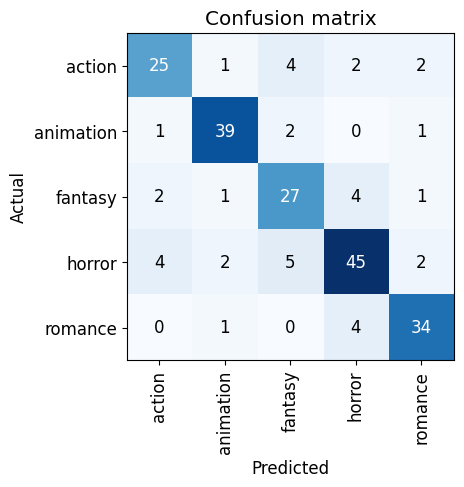

In [ ]:
# Checking confusion matrix
interp = ClassificationInterpretation.from_learner(learn4)
interp.plot_confusion_matrix()

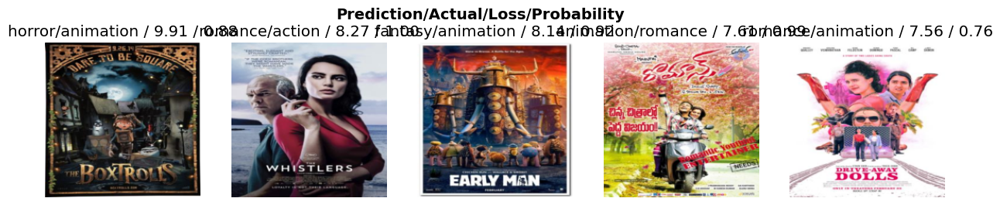

In [ ]:
# Worst performances by the model
interp.plot_top_losses(5, nrows=1,)

In [ ]:
# Image had many errors with labeling and downloads, cleaning them up and retraining
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [ ]:
classes = learn.dls.vocab
classes

['action', 'animation', 'fantasy', 'horror', 'romance']

In [ ]:
predictions = dict(zip(classes, np.array(learn3.predict('romance.jpg')[2])))

In [ ]:
predictions

{'action': 0.0053671706,
 'animation': 0.00088010926,
 'fantasy': 0.08278713,
 'horror': 0.00026880138,
 'romance': 0.91069686}

In [ ]:
for classes, pred in predictions.items():
  print(f'{classes}: {pred * 100: .2f}%')

action:  99.91%
anime:  0.02%
horror:  0.02%
science fiction:  0.05%


In [ ]:
# Exporting model to a PKL file to use on hugging face.
learn.export('model.pkl')